In [1]:
from ultralytics import YOLO
import os
import cv2
import matplotlib.pyplot as plt
import glob
from PIL import Image
import numpy as np

# Load the model
model = YOLO('runs/detect/train/weights/best.pt')

In [2]:
!yolo task=detect mode=predict model=runs/detect/train/weights/best.pt conf=0.35 source=waif/test/images save=True

Ultralytics YOLOv8.2.85 🚀 Python-3.12.4 torch-2.4.0 CPU (Apple M1)
Model summary (fused): 218 layers, 25,844,392 parameters, 0 gradients, 78.7 GFLOPs

image 1/194 /Users/princekhunt/Documents/Portfolio/Voice-Activated-Deterrent-System-for-Preventing-Wild-Animal-Intrusion-in-Farmland/waif/test/images/-144_jpg.rf.3c8a8aa2573f94ee1a43e5dbb6315bc0.jpg: 640x640 1 Sheep, 301.5ms
image 2/194 /Users/princekhunt/Documents/Portfolio/Voice-Activated-Deterrent-System-for-Preventing-Wild-Animal-Intrusion-in-Farmland/waif/test/images/-206_jpg.rf.eb257a4a05f89eebdcad2311f5ca3254.jpg: 640x640 (no detections), 245.7ms
image 3/194 /Users/princekhunt/Documents/Portfolio/Voice-Activated-Deterrent-System-for-Preventing-Wild-Animal-Intrusion-in-Farmland/waif/test/images/-286_jpg.rf.f636af33d10b44abe21456e7fdd9981b.jpg: 640x640 (no detections), 235.0ms
image 4/194 /Users/princekhunt/Documents/Portfolio/Voice-Activated-Deterrent-System-for-Preventing-Wild-Animal-Intrusion-in-Farmland/waif/test/images/-40_jpg.

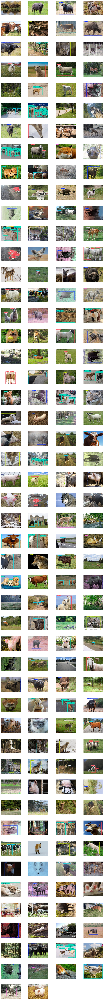

In [3]:
# Get the list of all predicted image file paths
predicted_path = glob.glob('./runs/detect/predict/*')

# Number of columns in the grid
num_columns = 4
# Number of images
num_images = len(predicted_path)
# Calculate the number of rows needed
num_rows = (num_images + num_columns - 1) // num_columns

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 3 * num_rows))
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing

# Flatten axes array for easy iteration
axes = axes.flatten()

# Display each image in the corresponding subplot
for ax, img_path in zip(axes, predicted_path):
    try:
        # Open image using PIL
        img = Image.open(img_path)
        # Convert PIL image to numpy array
        img_array = np.array(img)
        # Display image
        ax.imshow(img_array, aspect='auto')  # Adjust aspect ratio
        ax.axis('off')  # Turn off axis
    except Exception as e:
        print(f"Error opening {img_path}: {e}")
        ax.axis('off')  # Turn off axis for errors

# Turn off any remaining unused subplots
for ax in axes[len(predicted_path):]:
    ax.axis('off')

plt.show()